# Milestone P3 : Full notebook

In [1]:
import pandas as pd
import numpy as np
import re
from pathlib import Path

# dimensionality reduction
from sklearn.decomposition import PCA
from umap import umap_ as UMAP

# plotting
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

# clustering
from leiden_clustering import LeidenClustering
import utils

## Description of the features used
- duration in second: Time taken by the player to complete the path (directly provided in the dataset).
- backtrack: Number of backtracks made by the player in this path.
- numberOfPath: Number of paths previously played by the player, in total.
- position_mean: Character position of succeding clicked link on article page, averaged across all edges of path.
- position_std: Standard deviation of character position of succeding clicked link within a path.
- path_length: Simple measure of number of edges in path (pages clicked on) from beginning to end. Does not contains player backtracks, and so counts the final version of player path.
- coarse_mean_time: Measure of amount of time, on average, that the player took to travel from one edge to another in the path. It is called "coarse" because it is a global measure, that does not take into account outlier edges like the median could. This is especially noticeable on paths where the player disconnected, for example.
- semantic_similarity: This is a measure of the average similarity between two successive terms in the given path. The feature is calculated by computing the cosine similarity (normalised dot product) between embeddings (one-hot vectors projected to a lower dimensionality subspace) given by a sentence transformer, which is a model specifically trained in order to give embeddings which have "semantically relevant" / "semantically informative" relative positions. As such, the cosine similarity gives a measure of logical similarity of the words. A value of -1 represents opposite meanings / topics, around 0 means unrelated, and around 1 means highly similar meanings / topics. The mean of this is supposed to approximately capture how related topics globally were on a given path.
- ratio: The ratio between the user path and the shortest path between the start and end page.
- path_closeness_abs_sum : As each page in the path has a closeness centrality associated to it from the full network of Wikipedia, this features is obtained by looking at the derivative of the closeness centrality of each page in the path (that is, the delta between the closeness centrality of a page and the previous one in the path) and summing the absolute value of these deltas before and after the maximal degree page in the path. 
This is meant to quantify if the player is strongly looking for a hub page in the path, reaches it (as the maximal degree page is assumed to be a hub page) and then goesto a specific page from there, i.e. the target page. Indeed, a good player is expected to have a strongly positive delta before the maximal degree page and a strongly negative delta after it. We take the absolute value then sum them to have a single feature that aims at quantifying this behavior.

In [2]:
DATA_PATH = Path.cwd() / "../data"
FIG_PATH = Path.cwd() / "../src"
FILTER_TIMEOUT = False
if FILTER_TIMEOUT:
    FIG_PATH = FIG_PATH / "figures/leiden/"
else:
    FIG_PATH = FIG_PATH / "figures/leiden_with_timeout/"
FIG_PATH = FIG_PATH.resolve()
print(f"Figure path: {FIG_PATH}")
data = {
    Path(f).stem: pd.read_csv(f, index_col=0) for f in DATA_PATH.glob("combined_*.csv")
}
print(list(data.keys()))
if not FIG_PATH.exists():
    FIG_PATH.mkdir(parents=True)

Figure path: D:\ADA\ada-2023-project-adamants\src\figures\leiden_with_timeout
['combined_metrics_finished_edges', 'combined_metrics_finished_paths', 'combined_metrics_unfinished_edges', 'combined_metrics_unfinished_paths']


In [3]:
features_finished_paths = data["combined_metrics_finished_paths"].reset_index(drop=True)
features_unfinished_paths = data["combined_metrics_unfinished_paths"].reset_index(
    drop=True
)

## Data loading and pre-processing

Let's have a look at features distribution:

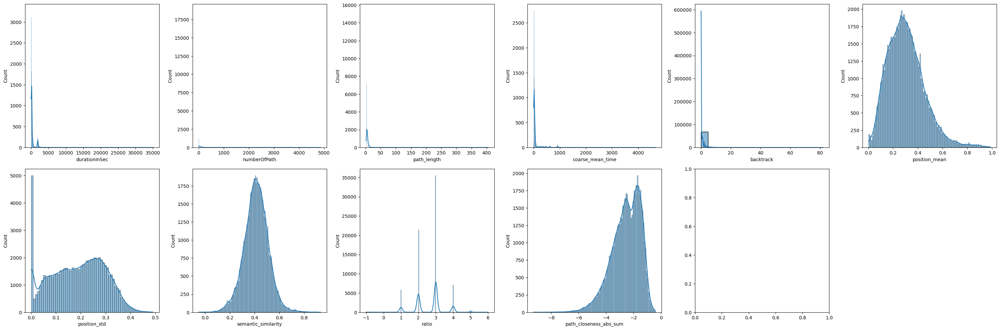

In [4]:
combined_df = pd.concat([features_finished_paths, features_unfinished_paths], axis=0)
fig, axs = plt.subplots(2, 6, figsize=(30, 10))
axs.flatten()[-1].axis("off")
i_log = 0
i_non_log = len(utils.COLS_LOG)
for feature in utils.FEATURES_COLS_USED_FOR_CLUSTERING:
    if feature in utils.COLS_LOG:
        i = i_log
        i_log = i_log + 1
    else:
        i = i_non_log
        i_non_log = i_non_log + 1
    ax = axs.flatten()[i]
    sns.histplot(combined_df[feature], kde=True, ax=ax)
fig.tight_layout()
plt.show()

We can see that the features in the first column are very heavy tailed, for this reason we will apply a log transform to them. 
Taking the log of backtrack (2nd row first column) does not help (probably as it is discrete and has only a few different values).

We will then normalize the features:
- We use z-score normalization
- NaN values in certain features are replaced by the mean

In [5]:
combined_df = pd.concat([features_finished_paths, features_unfinished_paths], axis=0)
combined_df["finished"] = [1] * len(features_finished_paths) + [0] * len(
    features_unfinished_paths
)
combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING] = utils.normalize_features(
    combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING]
)

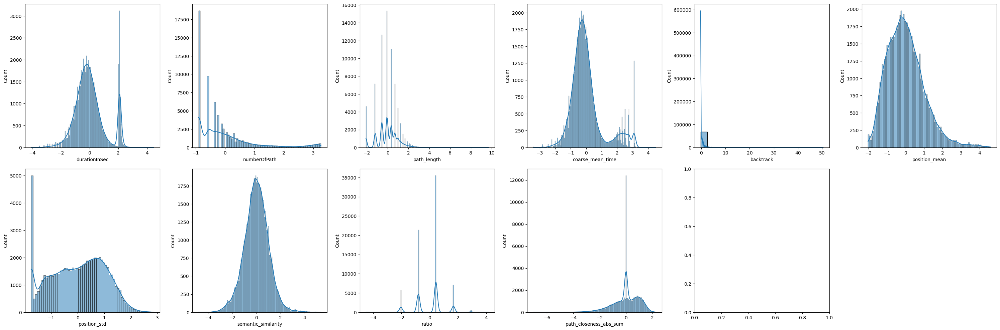

In [6]:
fig, axs = plt.subplots(2, 6, figsize=(30, 10))
axs.flatten()[-1].axis("off")
i_log = 0
i_non_log = len(utils.COLS_LOG)
for feature in utils.FEATURES_COLS_USED_FOR_CLUSTERING:
    ax = axs.flatten()[i]
    if feature in utils.COLS_LOG:
        i = i_log
        i_log = i_log + 1
        ax.set_xscale("log")
    else:
        i = i_non_log
        i_non_log = i_non_log + 1
        ax.set_xscale("linear")
    # use log until reaching i_non_log
    sns.histplot(combined_df[feature], kde=True, ax=ax)
fig.tight_layout()
plt.show()

## Correlations and PCA

In [7]:
combined_df.dropna(subset=utils.FEATURES_COLS_USED_FOR_CLUSTERING, inplace=True)
X = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().values

### PCA

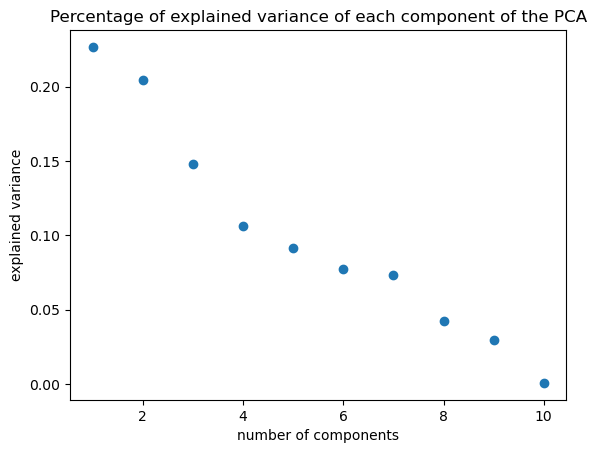

In [8]:
# find the dimensionality of the data
pca = PCA(n_components=X.shape[1])
pca.fit(X)
# plot the explained variance
plt.scatter(range(1, X.shape[1] + 1), pca.explained_variance_ratio_)
plt.xlabel("number of components")
plt.ylabel("explained variance")
plt.title("Percentage of explained variance of each component of the PCA")
plt.show()

We will keep only the 7 first dimensions as they explain most of the variance compared to further components.

### Correlation matrix

In [9]:
# feature names for labels
xlabels = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].columns
xlabels = [x.replace("_", " ") for x in xlabels]

def camel_to_snake(s):
    """Goes from camelCase to snake_case"""
    s = re.sub("(.)([A-Z][a-z]+)", r"\1_\2", s)
    return re.sub("([a-z0-9])([A-Z])", r"\1_\2", s).lower()

xlabels = [camel_to_snake(x) for x in xlabels]
# remove all underscores
xlabels = [x.replace("_", " ") for x in xlabels]
# cast letter in beginning to uppercase
xlabels = [x[0].upper() + x[1:] for x in xlabels]
ylabels = xlabels

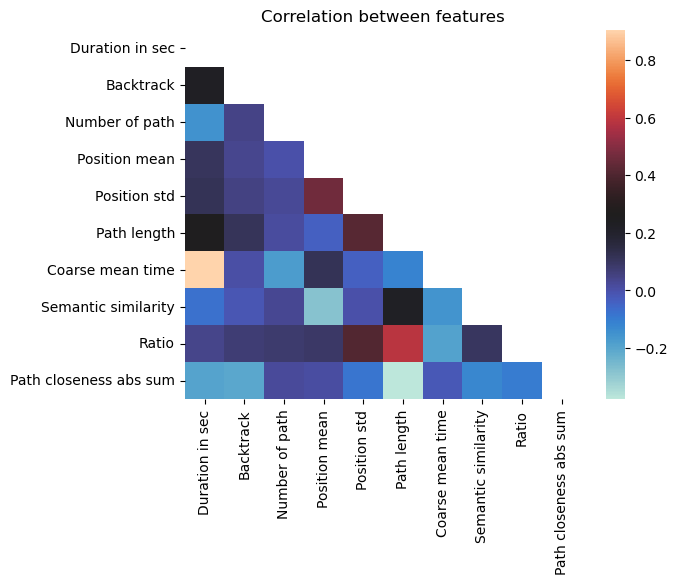

In [10]:
# show correlation between features
corr = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
corr = corr.mask(mask)
sns.heatmap(
    corr,
    annot=False,
    cmap="icefire",
    mask=mask,
)
plt.title("Correlation between features")
xticks_pos = np.arange(len(xlabels)) + 0.5
plt.xticks(xticks_pos, xlabels, rotation=90)
plt.yticks(xticks_pos, ylabels, rotation=0)
# TODO fix the tick labels
plt.show()

From this plot, we may notice some noteworthy correlations:
- Time-related features (duration, average_time_on_page, coarse_mean_time) are correlated with each other, which is expected.
- Path length and ratio are correlated with each other, which makes sense as the ratio is the path length divided by the number of pages in the path.

## Clustering without the timeouts

To give a shorter notebook we skipped some visualizations of the data, but they can be found in the jupyter book

In [11]:
features_finished_paths = data["combined_metrics_finished_paths"].reset_index(drop=True)
features_unfinished_paths = data["combined_metrics_unfinished_paths"].reset_index(
    drop=True
)

#filter out timeouts
features_unfinished_paths = features_unfinished_paths[
    features_unfinished_paths["type"] != "timeout"
]

# add origin for stratified sampling
features_unfinished_paths["origin"] = "unfinished"
features_finished_paths["origin"] = "finished"

#combine both dataframes
filtered_df = pd.concat([features_finished_paths, features_unfinished_paths], axis=0)
filtered_df["finished"] = [1] * len(features_finished_paths) + [0] * len(
    features_unfinished_paths
)
#normalize features
filtered_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING] = utils.normalize_features(
    filtered_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING]
)
#drop nan values
filtered_df.dropna(subset=utils.FEATURES_COLS_USED_FOR_CLUSTERING, inplace=True)
X_filtered = filtered_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().values

#### FOR COMPATIBILITY
combined_df = filtered_df.copy()
plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().dropna()

### The clustering

In [12]:
#fix seed for reproducibility
np.random.seed(2)
clustering = LeidenClustering(
    leiden_kws={"n_iterations": -1, "seed": 0, "resolution_parameter": 0.2},
    pca_kws={"n_components": 7},
)
clustering.fit(X_filtered)
clustering.labels_

array([0, 2, 2, ..., 0, 3, 0])

### The Heatmap of feature means for each cluster...

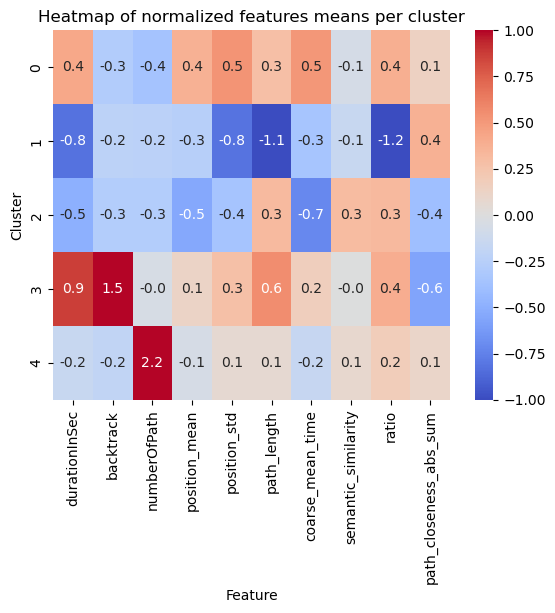

In [13]:
plot_data["cluster"] = clustering.labels_.astype(str)
# heatmap of features means per cluster
means = plot_data.groupby(plot_data["cluster"]).mean()
sns.heatmap(means, cmap="coolwarm", annot=True, fmt=".1f", vmin=-1, vmax=1)
plt.xlabel("Feature")
plt.ylabel("Cluster")
plt.title("Heatmap of normalized features means per cluster")
# plt.xticks(labels=xlabels, ticks=range(len(xlabels)), rotation=90) # TODO: fix this
plt.show()

### And the number of paths per cluster

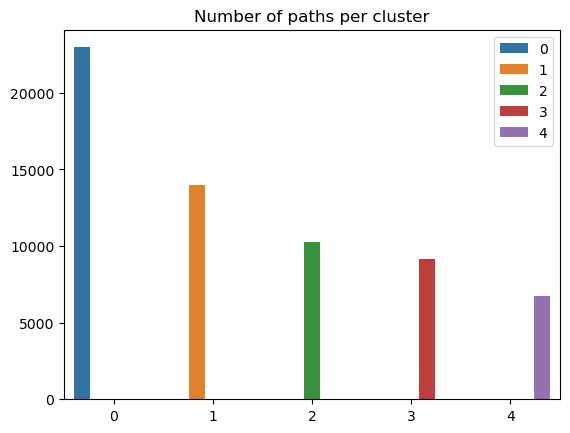

In [14]:
clusters_names,n_points = np.unique(plot_data["cluster"], return_counts=True)
sns.barplot(x=clusters_names, y=n_points, hue=np.unique(clusters_names)).set_title("Number of paths per cluster")
plt.show()

## Analysis of the clustering

To begin with, we can observe that we have one cluster that disappeared, it is the one that had all the timeouts ! Of course the other are a bit modified since the values of the duration are different, but the global trends stay identical.

### Let's try to name and characterize these groups !
#### To do so, we will mainly use the heatmap
*for a more detailed statitical analysis you can deep into the jupyter notebook leiden_clustering*

- The slow ones (cluster 0):

The players contained in cluster 0 are very slow (with the second biggest durationInSec value among all clusters, 0.4, and the worst coarse_mean_time value, 0.5).
They do not backtrack, click links fairly low in the article (with the biggest position_mean feature mean across all clusters) but this varies (position_std = 0.5).
This habit of searching for links further down on the article page might in part explain the slowness of these players.
They also have a high ratio, one that is amongst the worst (ratio = 0.4).
- The bosses (cluster 1):

The players contained in cluster 1 are very fast (durationInSec = -0.8), they click on fairly high-position links most times (position_mean = -0.3 and position_std = -0.8)
Their path length and ratio are top of the list, with path_length = -1.1 and ratio = -1.2.
This seemed suspicious at first: we thought their low ratio was due to them not finishing most of their games and therefore creating unrealistically short paths.
This however is not such a prominent bias, as the unfinished portion of games in this cluster is actually only of 1/3.
Moreover, the path_closeness_abs_sum feature confirms that this cluster's players play very well: they reach hubs fast, with a path_closeness_abs_sum of 0.4, and the biggest one among clusters.
Overall this cluster seems to contain either the "boss" players, or players that try one game quickly and don't finish it.
- The cautious ones (cluster 2):

The players contained in cluster 2 are fast (durationInSec = -0.5, coarse_mean_time = -0.7), they do not backtrack, and click on early links (position_mean = -0.5) most times (position_std = -0.4).
They finish most times (finished_normalized = 0.3) but do not do so with a good ratio (ratio = 0.3), and they do not have a high path_closeness_abs_sum.
When looking closer at samples from this cluster, they seem to at first reach hubs fast but then to slowly and cautiously go back down (which explains the low path_closeness_abs_sum), most likely to be sure to reach their target.
Players from cluster 2 have a good intuition but are afraid to get lost.
- The lost ones (cluster 3):

The players contained in cluster 3 are very slow overall (durationInSec = 0.9), but not so much on the average time they spend on a page (coarse_mean_time = 0.2).
This is explained by the fact that they backtrack VERY frequently (backtrack = 1.5).
They also have the longest paths (path_length = 0.6), and this is not due to the backtrack as path _length is computed without considering backtracks.
This shows how backtracking isn't necessarly going to improve player performance.
Players here also do not reach hubs easily, with the worst path_closeness_abs_sum value, -0.6; and they have an overall poor ratio (ratio = 0.4).
All in all, these players seem to have good intentious and to be meticoulous in their search of the next path, but without success. They just end up getting lost.
- The experienced ones (cluster 4):

The players contained in cluster 4 are fairly fast (durationInSec = -0.2), and do not backtrack much (backtrack = -0.2).
They have played a lot of games before (numberOfPath = 2.2), and finish a big portion of their games (with the biggest finished_normalized value across clusters, 0.4).
They perform fairly, but not extraordinarily well (ratio = 0.2 and path_closeness_abs_sum = 0.1).
They simply are experienced and able to easily finish their game.

#### But can we test the robustness of the clustering ? Is it very sensitive to the data or do the clusters qualitatively stay the same ? It is time to figure it out...

## Assessing variability using clustroids

We now have a clustering of our data points; however, to assess robustness of the clustering, we will use medoids, which are clustroids generated from the mean of each cluster. 
We will perform cross validation by :
- Splitting the data into 5 folds
- For each fold, we compute the Leiden clustering from scratch and assign a cluster to each training point.
- We compute the clustroids in the **original UMAP embedding** space (using all data points, not just the ones in the fold). This is to make clusterings comparable across folds : we show the clustering assignments of the training points in a consistent latent space.
- We use k-nearest neighbors to assign each test point to a cluster, again in the original UMAP embedding space.
- We obtain test clustroids by computing the mean of each cluster in the test set.

For now, we simply show the original clustroids in the entire dataset.

In [15]:
X = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy()
print(X.columns)
X = X.values
# find number of NaNs in each column
nans = np.isnan(X).sum(axis=0)
print(nans)
# drop rows with NaNs
X = X[~np.isnan(X).any(axis=1)]

Index(['durationInSec', 'backtrack', 'numberOfPath', 'position_mean',
       'position_std', 'path_length', 'coarse_mean_time',
       'semantic_similarity', 'ratio', 'path_closeness_abs_sum'],
      dtype='object')
[0 0 0 0 0 0 0 0 0 0]


In [16]:
# UMAP
umap = UMAP.UMAP(n_components=3, metric="euclidean")
result_umap_euc = umap.fit_transform(X)

In [17]:
X_w_clusters = pd.concat(
    [
        combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING]
        .dropna()
        .reset_index(drop=True),
        pd.DataFrame({"cluster": clustering.labels_}),
        pd.DataFrame(result_umap_euc, columns=["umap_1", "umap_2", "umap_3"]),
    ],
    axis=1,
)
X_w_clusters

,durationInSec,backtrack,numberOfPath,position_mean,position_std,path_length,coarse_mean_time,semantic_similarity,ratio,path_closeness_abs_sum,cluster,umap_1,umap_2,umap_3
0,0.450421,-0.292447,-0.397854,0.012312,0.948769,1.246512,-0.037357,1.896769,0.373468,-4.342440e-01,0,-1.107617,2.549133,2.624934
1,-0.246765,-0.292447,0.302599,-0.645120,-0.805592,-0.127465,-0.104634,1.187599,0.373468,9.426499e-01,2,-1.612024,3.621654,0.141211
2,0.247484,-0.292447,0.483877,-0.379822,-1.074044,0.971189,-0.133470,0.756814,0.373468,-4.075266e-01,2,-1.906021,3.432167,1.573302
3,-1.198556,-0.292447,-0.591540,-0.454105,-0.155640,-0.649073,-1.028104,0.515755,-0.908596,-9.236796e-16,1,9.620740,-0.366626,8.498927
4,0.508421,-0.292447,-0.922649,0.064624,1.137702,0.659053,0.399219,-0.870712,0.373468,5.543467e-01,0,0.845308,2.123000,1.607138
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63112,0.353632,-0.292447,0.508379,0.277953,1.172033,0.659053,0.196939,0.499099,1.655532,-1.163800e-01,0,-0.607751,6.962692,11.004099
63113,-0.467209,-0.292447,0.651736,-1.439055,-1.834725,-1.321543,0.340616,-1.735091,-0.908596,-9.236796e-16,1,9.239454,0.434836,6.629303
63114,0.551507,-0.292447,0.775702,0.796475,0.862001,0.298719,0.676819,0.057767,-0.908596,1.010689e+00,0,7.671624,-1.034239,7.682266
63115,0.539368,0.378896,0.802247,-0.319231,-0.426618,0.298719,0.247967,-0.508621,0.373468,-1.910789e+00,3,-1.946937,2.796353,2.952293


In [18]:
# find the clustroid of each cluster
clustroids = []
for cluster in np.unique(clustering.labels_):
    clustroid = X_w_clusters[X_w_clusters["cluster"] == cluster].mean()
    clustroids.append(clustroid)
clustroids = pd.DataFrame(clustroids)
clustroids

,durationInSec,backtrack,numberOfPath,position_mean,position_std,path_length,coarse_mean_time,semantic_similarity,ratio,path_closeness_abs_sum,cluster,umap_1,umap_2,umap_3
0,0.425451,-0.281488,-0.360041,0.367251,0.528534,0.281371,0.514292,-0.068535,0.388703,0.144026,0.0,1.211408,2.394772,4.380532
1,-0.827960,-0.219059,-0.228548,-0.255208,-0.818939,-1.088791,-0.347516,-0.149015,-1.226315,0.373028,1.0,9.133989,1.646415,6.270227
2,-0.499614,-0.275939,-0.278799,-0.545994,-0.354798,0.314202,-0.717286,0.306310,0.327613,-0.393830,2.0,-0.630120,2.558968,2.411231
3,0.870473,1.491318,-0.047216,0.122576,0.275930,0.556719,0.165314,-0.002144,0.396029,-0.564402,3.0,0.839852,3.006332,5.348508
4,-0.152311,-0.189854,2.195148,-0.055830,0.063649,0.063731,-0.161977,0.078423,0.180978,0.102862,4.0,2.045322,0.935290,4.422516


In [19]:
from plotly import graph_objects as go

fig_clusters = px.scatter_3d(
    result_umap_euc,
    x=0,
    y=1,
    z=2,
    color=clustering.labels_.astype(str),
    title="UMAP, clustering by leiden_clustering, with clustroids",
    # reduce size points
    size_max=0.1,
    # make scatter alpha = 0.1
    opacity=0.1,
    category_orders={"color": [str(i) for i in range(0, len(np.unique(clustering.labels_)))]},
)
fig_clusters.add_trace(
    go.Scatter3d(
        x=clustroids["umap_1"],
        y=clustroids["umap_2"],
        z=clustroids["umap_3"],
        mode="markers",
        marker=dict(
            size=10,
            symbol="cross",
            color="black"
            # color=clustering.labels_.astype(str),
        ),
        name="Clustroids",
    )
)
fig_clusters.update_layout(
    {"plot_bgcolor": "rgba(0, 0, 0, 0)", "paper_bgcolor": "rgba(0, 0, 0, 0)"}
)
fig_clusters.update_layout(font_color="white")
fig_clusters.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        zaxis=dict(showticklabels=False),
    )
)
fig_clusters.update_layout(legend_title_text="Cluster")
fig_clusters.update_layout(
    scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3")
)
EXPORT = False
if EXPORT:
    fig_clusters.write_html(FIG_PATH / "umap_w_clustroids.html")

fig_clusters.show()

In [20]:
N_FOLDS = 5
N_CLUSTERS = plot_data["cluster"].nunique()
features_used = utils.FEATURES_COLS_USED_FOR_CLUSTERING

In [21]:
from sklearn.model_selection import StratifiedKFold
from sklearn.neighbors import KNeighborsClassifier

kfold = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=1)

clustering_train_results = {}
clustering_test_results = {}
clustroids_train_results = {}
clustroids_test_results = {}

# run clustering on each fold, stratified by origin
cv_combined_df = combined_df.copy()[features_used + ["origin"]].dropna()
for fold, (train_idx, test_idx) in enumerate(
    kfold.split(cv_combined_df[features_used], cv_combined_df["origin"])
):
    print(f"Fold {fold}")
    X_train = cv_combined_df.iloc[train_idx][features_used].values
    X_test = cv_combined_df.iloc[test_idx][features_used].values

    print(f"Trains set : {X_train.shape}")
    print(f"Test set : {X_test.shape}")


    # find resolution parameter that leads to the previous number of clusters
    repeat = True
    resolution_parameter = 0.2
    resolution_parameters = [0.2]
    step=0.02
    while repeat:
        # fix seed for reproducibility
        print("Clustering train set")
        np.random.seed(1)
        train_clustering = LeidenClustering(
            leiden_kws={"n_iterations": -1, "seed": 0, "resolution_parameter": resolution_parameter},
            pca_kws={"n_components": 7},
        )
        train_clustering.fit(X_train)
        unique_labels=np.unique(train_clustering.labels_)
        print(f"Resolution parameter: {resolution_parameter}, n groups: {len(unique_labels)}")
        if len(unique_labels) == N_CLUSTERS:
            repeat = False
        # too many clusters, decrease resolution parameter
        elif len(unique_labels) > N_CLUSTERS:
            if resolution_parameter - step <= 0:
                #send error message
                raise ValueError("Could not find a resolution parameter that does not lead to more clusters than expected")
            if resolution_parameter - step in resolution_parameters:
                step=step/2.
            resolution_parameter -= step
        # too few clusters, increase resolution parameter
        else:
            if resolution_parameter + step >= 1:
                #send error message
                raise ValueError("Could not find a resolution parameter that does not lead to less clusters than expected")
            if resolution_parameter + step in resolution_parameters:
                step=step/2.
            resolution_parameter += step
        resolution_parameters.append(resolution_parameter)

    X_train_w_clusters = pd.concat(
        [
            combined_df[features_used].iloc[train_idx].dropna().reset_index(drop=True),
            pd.DataFrame({"cluster": train_clustering.labels_}),
            pd.DataFrame(
                result_umap_euc[train_idx], columns=["umap_1", "umap_2", "umap_3"]
            ),
        ],
        axis=1,
    )
    clustering_train_results[fold] = X_train_w_clusters
    # compute train clustroids
    print("Computing train clustroids")
    train_clustroids = []
    for cluster in np.unique(train_clustering.labels_):
        clustroid = X_train_w_clusters[X_train_w_clusters["cluster"] == cluster].mean()
        train_clustroids.append(clustroid)
    train_clustroids = pd.DataFrame(train_clustroids)
    clustroids_train_results[fold] = train_clustroids

    # test clustering using nearest neighbors
    print("Clustering test set using nearest neighbors")
    test_clustering = KNeighborsClassifier(n_neighbors=20)
    # fit on UMAP embeddings
    test_clustering.fit(result_umap_euc[train_idx], train_clustering.labels_)
    # predict on UMAP embeddings
    test_clustering.labels_ = test_clustering.predict(result_umap_euc[test_idx])

    X_test_w_clusters = pd.concat(
        [
            combined_df[features_used].iloc[test_idx].dropna().reset_index(drop=True),
            pd.DataFrame({"cluster": test_clustering.labels_}),
            pd.DataFrame(
                result_umap_euc[test_idx], columns=["umap_1", "umap_2", "umap_3"]
            ),
        ],
        axis=1,
    )
    clustering_test_results[fold] = X_test_w_clusters
    # find the clustroid of each cluster
    print("Computing test clustroids")
    test_clustroids = []
    for cluster in np.unique(train_clustering.labels_):
        clustroid = X_test_w_clusters[X_test_w_clusters["cluster"] == cluster].mean()
        test_clustroids.append(clustroid)
    test_clustroids = pd.DataFrame(test_clustroids)
    clustroids_test_results[fold] = test_clustroids
    colors = {
        "0": "red",
        "1": "blue",
        "2": "green",
        "3": "yellow",
        "4": "purple",
        "5": "orange",
    }
    # Train plot
    # fig = px.scatter_3d(
    #     result_umap_euc[train_idx],
    #     x=0,
    #     y=1,
    #     z=2,
    #     color=[colors[str(c)] for c in train_clustering.labels_],
    #     title=f"Train : UMAP, clustering by leiden_clustering\nFold {fold}",
    #     # reduce size points
    #     size_max=0.1,
    #     opacity=0.1,
    # )
    # fig.show()
    # # Test plot
    # fig = px.scatter_3d(
    #     result_umap_euc[test_idx],
    #     x=0,
    #     y=1,
    #     z=2,
    #     color=[colors[str(c)] for c in test_clustering.labels_],
    #     title=f"Test : UMAP, clustering by leiden_clustering\nFold {fold}",
    #     # reduce size points
    #     size_max=0.1,
    #     opacity=0.1,
    # )
    # fig.show()
    print("_" * 80)

Fold 0
Trains set : (50493, 10)
Test set : (12624, 10)
Clustering train set
Resolution parameter: 0.2, n groups: 5
Computing train clustroids
Clustering test set using nearest neighbors
Computing test clustroids
________________________________________________________________________________
Fold 1
Trains set : (50493, 10)
Test set : (12624, 10)
Clustering train set
Resolution parameter: 0.2, n groups: 5
Computing train clustroids
Clustering test set using nearest neighbors
Computing test clustroids
________________________________________________________________________________
Fold 2
Trains set : (50494, 10)
Test set : (12623, 10)
Clustering train set
Resolution parameter: 0.2, n groups: 5
Computing train clustroids
Clustering test set using nearest neighbors
Computing test clustroids
________________________________________________________________________________
Fold 3
Trains set : (50494, 10)
Test set : (12623, 10)
Clustering train set
Resolution parameter: 0.2, n groups: 6
Cluste

## Assessing the variability of the clustering across folds

We now face a problem linked to the implementation of Leiden : the cluster labels are not consistent across folds.

Therefore, if we now try to compare distributions of cluster features across folds, we will not be able to compare properly the clusters.

Below we show the means of each feature across clusters, for each fold; where the issue is readily apparent.

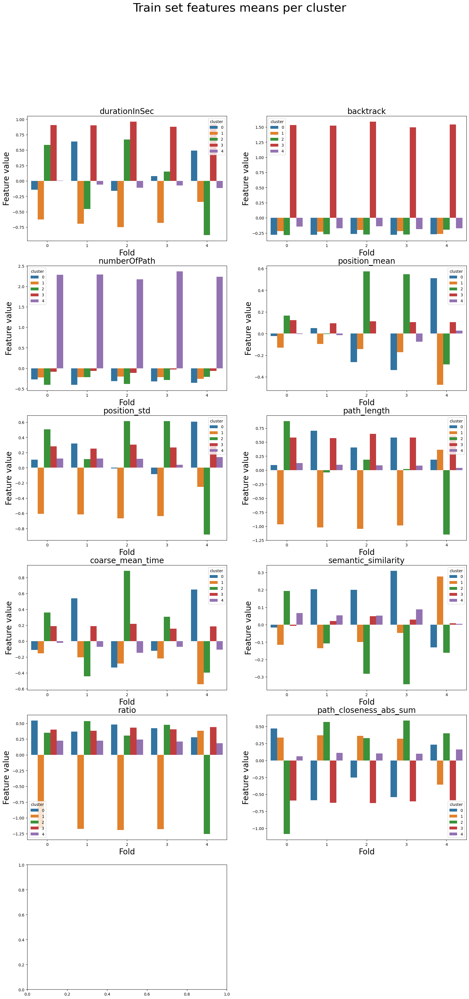

In [22]:
# barplot of the mean of each feature for all the train sets
for fold, df in clustering_train_results.items():
    df["fold"] = fold
train_features_df = pd.concat(clustering_train_results.values(), axis=0)
train_features_df = train_features_df.groupby(["fold", "cluster"]).mean().reset_index()

fig, axs = plt.subplots(6, 2, figsize=(20, 40))
fig.suptitle("Train set features means per cluster", fontsize=30)
axs = axs.flatten()
axs[-1].axis("off")
for i, feature in enumerate(features_used):
    sns.barplot(
        data=train_features_df,
        x="fold",
        y=feature,
        hue="cluster",
        errorbar="ci",
        palette="tab10",
        ax=axs[i],
    )
    axs[i].set_xlabel("Fold", fontsize=20)
    axs[i].set_ylabel("Feature value", fontsize=20)
    axs[i].set_title(feature, fontsize=20)

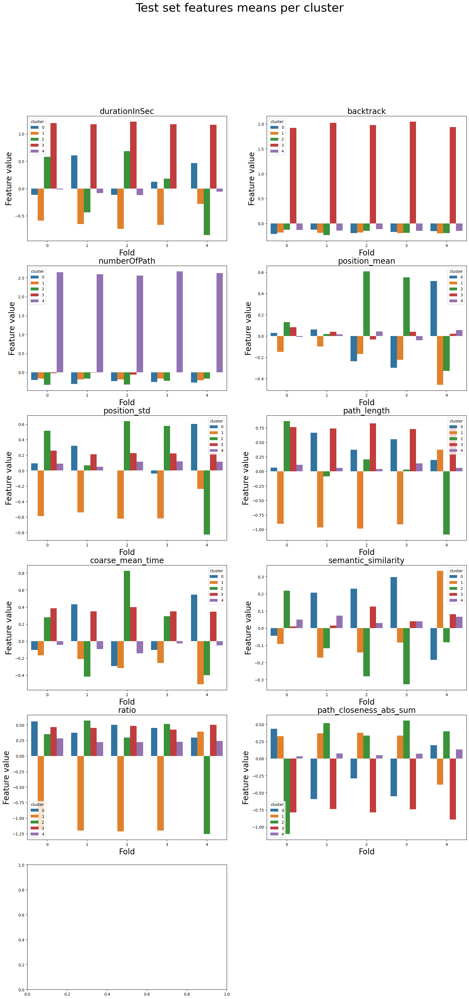

In [23]:
for fold, df in clustering_test_results.items():
    df["fold"] = fold
test_features_df = pd.concat(clustering_test_results.values(), axis=0)
test_features_df = test_features_df.groupby(["fold", "cluster"]).mean().reset_index()
test_features_df

fig, axs = plt.subplots(6, 2, figsize=(20, 40))
fig.suptitle("Test set features means per cluster", fontsize=30)
axs = axs.flatten()
axs[-1].axis("off")
for i, feature in enumerate(features_used):
    sns.barplot(
        data=test_features_df,
        x="fold",
        y=feature,
        hue="cluster",
        errorbar="ci",
        palette="tab10",
        ax=axs[i],
    )
    axs[i].set_xlabel("Fold", fontsize=20)
    axs[i].set_ylabel("Feature value", fontsize=20)
    axs[i].set_title(feature, fontsize=20)

In [24]:
for fold in range(len(clustroids_test_results)):
    clustroids_test_results[fold]["fold"] = fold

clustroids_test_results_tmp = pd.concat(clustroids_test_results.values()).copy()
test_clustroids = clustroids_test_results_tmp.groupby(["fold", "cluster"]).mean()
clustroid_coordinates = test_clustroids[["umap_1", "umap_2", "umap_3"]]
display(clustroid_coordinates)

umap_1    umap_2    umap_3
fold cluster                              
0    0.0     -0.367219  2.847011  2.377605
     1.0      9.038926  1.241969  6.633843
     2.0      0.494159  2.349472  5.235715
     3.0      0.625342  3.394092  5.841272
     4.0      1.895067  0.568144  5.098432
1    0.0      0.527236  2.632872  4.624590
     1.0      9.069517  1.173576  6.587983
     2.0     -0.552488  2.750510  2.042750
     3.0      0.692302  3.364044  5.887834
     4.0      2.297152  0.647605  5.071100
2    0.0     -0.463544  2.920113  3.451505
     1.0      9.165118  1.271744  6.559513
     2.0      1.617070  2.020344  3.875351
     3.0      0.668133  3.443437  6.149098
     4.0      2.248706  0.739716  4.928270
3    0.0     -0.575766  2.903790  3.509942
     1.0      9.095668  1.317988  6.649416
     2.0      0.678652  2.400847  3.245425
     3.0      0.841541  3.352670  5.972459
     4.0      2.334850  0.647066  5.078170
4    0.0      1.631184  2.027702  4.338274
     1.0     -0.438033  2.798249  3.106534
     2.0      9.365258  1.659720  6.382227
     3.0      0.499260  3.431417  5.997583
     4.0      2.410004  0.853439  5.174749

## Matching to the rescue

However, there is a way to prevent this issue : matching. To do this, we can assign the nearest clustroids for a given fold to the closest ones across other folds. 
This way, we can compare the clusters by assigning them to other clusters that are likely the same.

In [25]:
nearest_clustroids = {}
# report which cluster to match with which in other folds
# in the format (fold_i, cluster_i) : {fold_j1, cluster_j1, distance_j1}, {fold_j2, cluster_j2, distance_j2}, ...
# of shape n_folds x n_clusters x n_clusters-1
for fold_i in range(N_FOLDS):
    for cluster_i in range(N_CLUSTERS):
        nearest_clustroids[(fold_i, cluster_i)] = []
        for fold_j in range(N_FOLDS):
            if fold_i == fold_j:
                continue
            distances = {}
            for cluster_j in range(N_CLUSTERS):
                distances[fold_j, cluster_j] = np.linalg.norm(
                    clustroid_coordinates.loc[fold_i, cluster_i]
                    - clustroid_coordinates.loc[fold_j, cluster_j]
                )
            # find minimum distance and append according to format
            # print(list(distances.values()))
            min_dist_id = np.argmin(list(distances.values()))
            nearest_clustroids[(fold_i, cluster_i)].append(
                (fold_j, min_dist_id, distances[fold_j, min_dist_id])
            )
display(nearest_clustroids)

{(0, 0): [(1, 2, 0.39467028580557895),
  (2, 0, 1.0806868960865863),
  (3, 0, 1.1527806796991444),
  (4, 1, 0.7339827457851795)],
 (0, 1): [(1, 1, 0.08784386688488575),
  (2, 1, 0.1494524568809154),
  (3, 1, 0.09613104986711174),
  (4, 2, 0.5867873248553004)],
 (0, 2): [(1, 0, 0.6744498676524991),
  (2, 3, 1.4357206884835976),
  (3, 3, 1.2922350076504032),
  (4, 3, 1.3232816996270647)],
 (0, 3): [(1, 3, 0.08691712267048904),
  (2, 3, 0.31467891445677865),
  (3, 3, 0.25625706276011023),
  (4, 3, 0.20426237817383752)],
 (0, 4): [(1, 4, 0.4107721901127088),
  (2, 4, 0.4283145962690895),
  (3, 4, 0.44726844751255507),
  (4, 4, 0.5936147420399945)],
 (1, 0): [(0, 2, 0.6744498676524991),
  (2, 2, 1.4574930956882797),
  (3, 2, 1.4067191126743162),
  (4, 0, 1.2910881854645704)],
 (1, 1): [(0, 1, 0.08784386688488575),
  (2, 1, 0.13995414561907316),
  (3, 1, 0.15910053349536676),
  (4, 2, 0.6050903138646051)],
 (1, 2): [(0, 0, 0.39467028580557895),
  (2, 0, 1.421712460441738),
  (3, 0, 1.4753602

In [26]:
# make a dataframe that shows for folds : cluster_from, cluster_to, fold, distance
matched_df = pd.DataFrame(
    columns=["fold_from", "cluster_from", "fold_to", "cluster_to", "distance"]
)
for fold_i in range(N_FOLDS):
    for cluster_i in range(N_CLUSTERS):
        for fold_j, cluster_j, distance in nearest_clustroids[(fold_i, cluster_i)]:
            matched_df = pd.concat(
                [
                    matched_df,
                    pd.DataFrame(
                        {
                            "fold_from": [fold_i],
                            "cluster_from": [cluster_i],
                            "fold_to": [fold_j],
                            "cluster_to": [cluster_j],
                            "distance": [distance],
                        }
                    ),
                ]
            )
display(matched_df)

,fold_from,cluster_from,fold_to,cluster_to,distance
0,0,0,1,2,0.394670
0,0,0,2,0,1.080687
0,0,0,3,0,1.152781
0,0,0,4,1,0.733983
0,0,1,1,1,0.087844
...,...,...,...,...,...
0,4,3,3,3,0.352120
0,4,4,0,4,0.593615
0,4,4,1,4,0.256606
0,4,4,2,4,0.315756


In [27]:
def extract_fold_coordinates(fold, matched_df=matched_df):
    matched_df = matched_df.loc[matched_df["fold_from"] == fold]
    coordinates_matched = []
    for cluster_from in matched_df["cluster_from"].unique():
        coordinates_matched.append([clustroid_coordinates.loc[fold, cluster_from]])
        other_coords = [
            clustroid_coordinates.loc[
                matched_df.loc[
                    (matched_df["cluster_from"] == cluster_from)
                    & (matched_df["cluster_to"] == cluster_to)
                ]["fold_to"].values[0],
                cluster_to,
            ]
            for cluster_to in matched_df.loc[
                (matched_df["cluster_from"] == cluster_from)
            ]["cluster_to"].values
        ]
        coordinates_matched[-1].extend(other_coords)
    coordinates_matched = np.array(
        coordinates_matched
    )  # shape is N_FOLDS x N_CLUSTERS x 3
    coordinates_matched = pd.DataFrame(
        coordinates_matched.reshape(N_CLUSTERS * N_FOLDS, 3),
        columns=["umap_1", "umap_2", "umap_3"],
    )
    coordinates_matched["cluster"] = np.repeat(np.arange(N_CLUSTERS), N_FOLDS)
    return coordinates_matched


coordinates_matched_fold0 = extract_fold_coordinates(0)

### Plot of clustroids variation across folds

Now that we have matched the clusters, we can start comparing them across folds.
In the following plot, we show the clustroids of each fold, matched to the clustroids of the fourth fold. 
The clustroids are overall similar across folds, and match the ones in the original clustering in the data, demonstrating a degree of robustness of the clustering.

In [28]:
# we use the fourth fold as it contains the best matchings
coordinates_matched_fold4 = extract_fold_coordinates(4)
fig = px.scatter_3d(
    coordinates_matched_fold4,
    x="umap_1",
    y="umap_2",
    z="umap_3",
    color="cluster",
    title=f"Variability of clustroids across folds",
    opacity=0.7,
    symbol=list(range(5)) * 5,
    # color_continuous_scale=px.colors.sequential.haline,
)
fig.add_trace(
    go.Scatter3d(
        x=clustroids["umap_1"],
        y=clustroids["umap_2"],
        z=clustroids["umap_3"],
        mode="markers",
        marker=dict(
            size=10,
            symbol="cross",
            color="black"
            # color=clustering.labels_.astype(str),
        ),
        name="Original clustroids",
    )
)

fig_clusters.update_layout(
    {"plot_bgcolor": "rgba(0, 0, 0, 0)", "paper_bgcolor": "rgba(0, 0, 0, 0)"}
)
fig_clusters.update_layout(font_color="white")
fig_clusters.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False),
        yaxis=dict(showticklabels=False),
        zaxis=dict(showticklabels=False),
    )
)
fig_clusters.update_layout(legend_title_text="Cluster")
fig_clusters.update_layout(
    scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3")
)
fig.update_layout(
    legend=dict(
        yanchor="top",
        y=0.99,
        xanchor="left",
        x=0.01,
        font=dict(color="white"),
        bgcolor="rgba(0,0,0,0)",
        title=dict(text="Fold", font=dict(color="white")),
    )
)
fig.update_coloraxes(colorbar=dict(title=dict(font=dict(color="white"))))
fig.update_coloraxes(colorbar=dict(tickfont=dict(color="white")))

if EXPORT:
    fig.write_html(FIG_PATH / "clustroids_variability.html")

fig.show()

In [29]:
matched_df_fold4 = matched_df.loc[matched_df["fold_from"] == 4]
# display(matched_df_fold4)

# get the features using cluster matching from fold 4
features_matched = test_features_df
# reorder using the matched_df_fold4
# display(features_matched)
i = 0
matched_features_means = pd.DataFrame(columns=features_matched.columns)
for row in matched_df_fold4.iterrows():
    if i == row[1]["cluster_from"]:
        # append the row from fold 4
        new_row = (
            features_matched.loc[
                (features_matched["fold"] == 4)
                & (features_matched["cluster"] == row[1]["cluster_from"])
            ]
            .iloc[0]
            .to_dict()
        )
        # print(new_row)
        matched_features_means.loc[len(matched_features_means)] = new_row
        i += 1
    # find fold_to and cluster_to in fold and cluster columns of matched_df_fold4
    new_row = (
        features_matched.loc[
            (features_matched["fold"] == row[1]["fold_to"])
            & (features_matched["cluster"] == row[1]["cluster_to"])
        ]
        .iloc[0]
        .to_dict()
    )
    # print(new_row)
    matched_features_means.loc[len(matched_features_means)] = new_row
matched_features_means

,fold,cluster,durationInSec,backtrack,numberOfPath,position_mean,position_std,path_length,coarse_mean_time,semantic_similarity,ratio,path_closeness_abs_sum,umap_1,umap_2,umap_3
0,4.0,0.0,0.467695,-0.153092,-0.273994,0.517576,0.600389,0.195799,0.545493,-0.183928,0.294102,0.195605,1.631184,2.027702,4.338274
1,0.0,2.0,0.578309,-0.123091,-0.335148,0.131691,0.513015,0.865630,0.277820,0.218363,0.349143,-1.106847,0.494159,2.349472,5.235715
2,1.0,0.0,0.607554,-0.124822,-0.310035,0.061025,0.320233,0.667750,0.432782,0.207143,0.372179,-0.592349,0.527236,2.632872,4.624590
3,2.0,2.0,0.686405,-0.148206,-0.327783,0.606981,0.637584,0.207167,0.823426,-0.280753,0.297195,0.339170,1.617070,2.020344,3.875351
4,3.0,2.0,0.181559,-0.188544,-0.224822,0.550900,0.577611,0.029719,0.291457,-0.326842,0.514503,0.557388,0.678652,2.400847,3.245425
5,4.0,1.0,-0.279962,-0.199945,-0.212194,-0.459536,-0.238472,0.373491,-0.506608,0.333263,0.392367,-0.383394,-0.438033,2.798249,3.106534
6,0.0,0.0,-0.114235,-0.210244,-0.206718,0.030370,0.092120,0.066457,-0.102786,-0.044546,0.556658,0.439609,-0.367219,2.847011,2.377605
7,1.0,2.0,-0.436330,-0.235628,-0.165763,0.017393,0.065484,-0.088692,-0.414928,-0.116494,0.568933,0.520611,-0.552488,2.750510,2.042750
8,2.0,0.0,-0.114126,-0.195399,-0.235022,-0.237876,0.001682,0.372158,-0.292958,0.229395,0.500475,-0.288187,-0.463544,2.920113,3.451505
9,3.0,0.0,0.121332,-0.173287,-0.257018,-0.299862,-0.040069,0.552121,-0.103513,0.297555,0.452764,-0.554262,-0.575767,2.903790,3.509942


## Variability of features across folds in matched clusters

Finally, we can compare the distributions of features across folds, in the matched clusters.

It is possible that due to how the matching was performed (using clustroid distances in the UMAP latent space generated from all data points), 
the clusters are not matched properly when we go back to feature space.

However, the distributions of features across folds are still very similar in most cases.

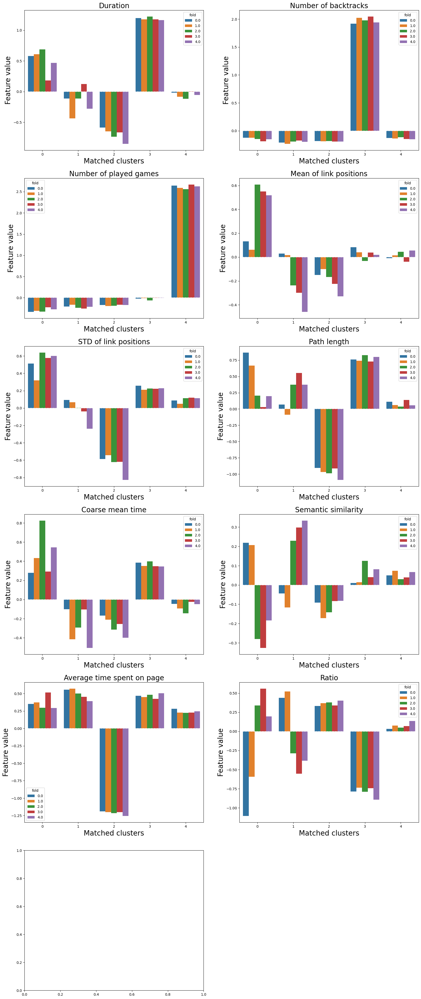

In [30]:
matched_features_means["matched_cluster"] = np.repeat(np.arange(5), 5)
feature_names_titles = [
    "Duration",
    "Number of backtracks",
    "Number of played games",
    "Mean of link positions",
    "STD of link positions",
    "Path length",
    "Coarse mean time",
    "Semantic similarity",
    "Average time spent on page",
    "Ratio",
    "Path closeness absolute sum",
]
fig, axs = plt.subplots(6, 2, figsize=(20, 50))
fig.patch.set_alpha(0)
fig.set_facecolor("none")
# fig.tight_layout()
axs = axs.flatten()
axs[-1].axis("off")
for i, feature in enumerate(features_used):
    axs[i].patch.set_alpha(0)
    axs[i].set_facecolor("none")
    sns.barplot(
        data=matched_features_means,
        x="matched_cluster",
        y=feature,
        hue="fold",
        errorbar="ci",
        palette="tab10",
        ax=axs[i],
    )
    axs[i].axhline(y=0, color="white", linestyle="--", alpha=0.5)
    axs[i].set_xlabel("Matched clusters", fontsize=20)
    axs[i].set_ylabel("Feature value", fontsize=20)
    axs[i].set_title(feature_names_titles[i], fontsize=20)

# export with transparent background
if EXPORT:
    fig.savefig(
        FIG_PATH / "CV_matched_clusters_feattures_means_results.png",
        transparent=True,
        bbox_inches="tight",
        pad_inches=0,
    )

plt.show()

## Clustering with the timeouts

In [31]:
features_finished_paths = data["combined_metrics_finished_paths"].reset_index(drop=True)
features_unfinished_paths = data["combined_metrics_unfinished_paths"].reset_index(
    drop=True
)

combined_df = pd.concat([features_finished_paths, features_unfinished_paths], axis=0)
combined_df["finished"] = [1] * len(features_finished_paths) + [0] * len(
    features_unfinished_paths
)
combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING] = utils.normalize_features(
    combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING]
)

In [32]:
combined_df.dropna(subset=utils.FEATURES_COLS_USED_FOR_CLUSTERING, inplace=True)
X = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().values

In [33]:
#fix seed for reproducibility
np.random.seed(2)
clustering = LeidenClustering(
    leiden_kws={"n_iterations": -1, "seed": 0, "resolution_parameter": 0.2},
    pca_kws={"n_components": 7},
)
clustering.fit(X)
clustering.labels_

array([0, 5, 0, ..., 3, 3, 4])

In [34]:
# UMAP
umap = UMAP.UMAP(n_components=3, metric="euclidean")
result_umap_euc = umap.fit_transform(X)

### UMAP plot of the Leiden clustering

In [35]:
fig = px.scatter_3d(
    result_umap_euc,
    x=0,
    y=1,
    z=2,
    color=clustering.labels_.astype(str),
    category_orders={"color": [str(i) for i in range(0, len(np.unique(clustering.labels_)))]},
    title="UMAP, clustering by leiden algorithm",
    # reduce size points
    size_max=0.1,
)
fig.update_layout({"plot_bgcolor": "rgba(0, 0, 0, 0)", "paper_bgcolor": "rgba(0, 0, 0, 0)"})
fig.update_layout(font_color="white")
fig.update_layout(scene=dict(xaxis=dict(showticklabels=False), yaxis=dict(showticklabels=False), zaxis=dict(showticklabels=False)))
fig.update_layout(legend_title_text="Cluster")
fig.update_layout(scene=dict(xaxis_title="UMAP 1", yaxis_title="UMAP 2", zaxis_title="UMAP 3"))

fig.show()

### Features distributions across clusters

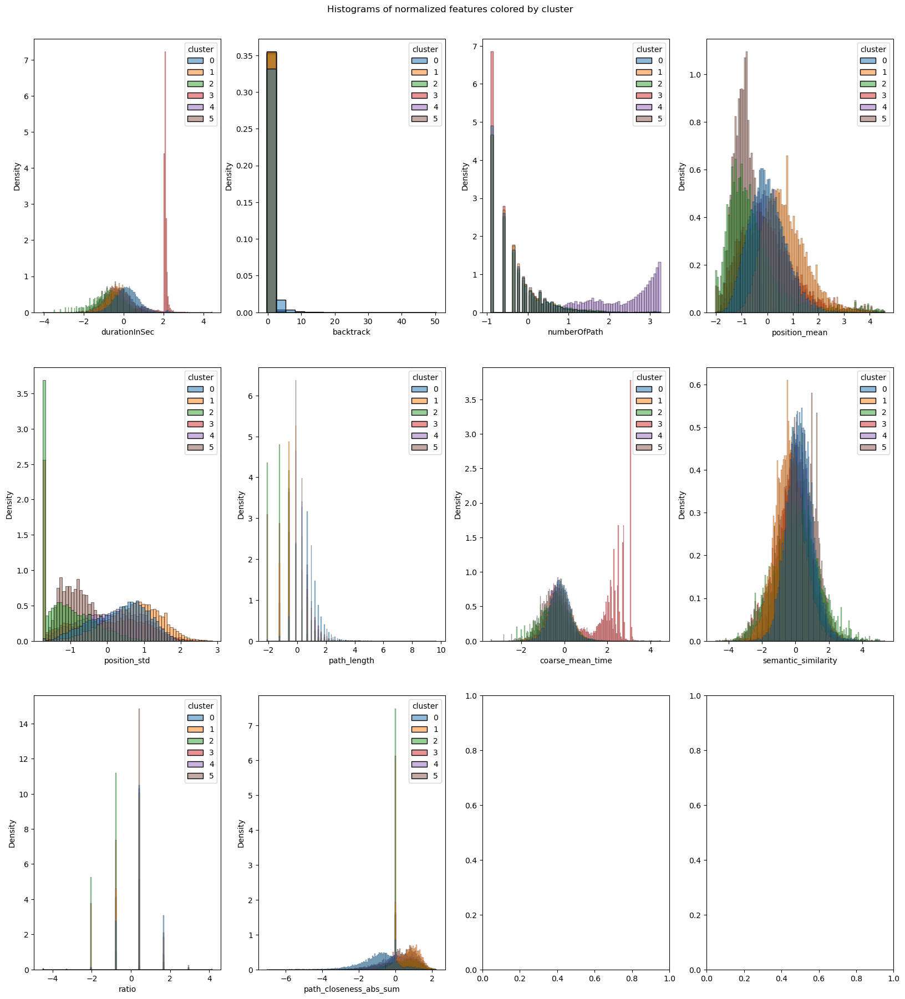

In [36]:
# plot histogram features colored by cluster
plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING].copy().dropna()
plot_data["cluster"] = clustering.labels_
plot_data["cluster"] = plot_data["cluster"].astype("category")
n_features = len(plot_data.columns) - 1
n_cols = 4
n_rows = int(np.ceil(n_features / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 20))
axs = axs.flatten()
for i, col in enumerate(plot_data.columns):
    if col == "cluster":
        continue
    sns.histplot(
        data=plot_data,
        x=col,
        hue="cluster",
        ax=axs[i],
        stat="density",
        common_norm=False,
    )
plt.suptitle("Histograms of normalized features colored by cluster")
plt.subplots_adjust(top=0.95)
plt.show()

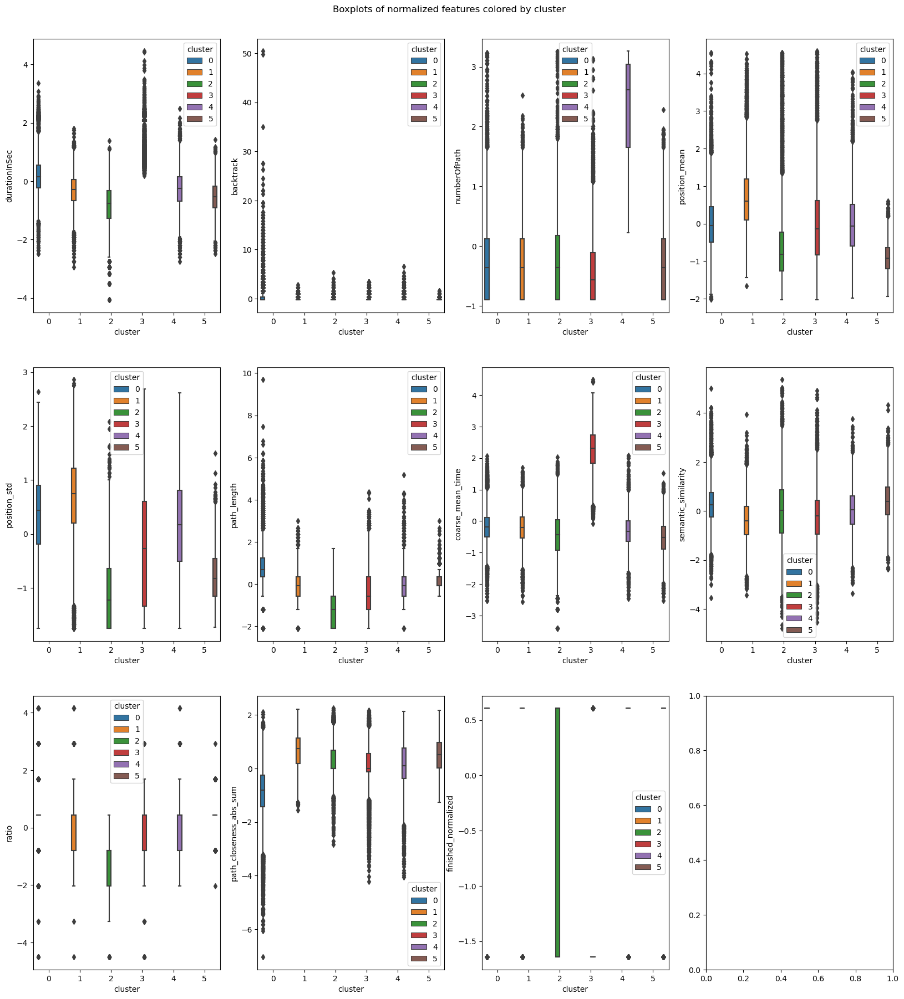

In [37]:
# plot the boxplots of features colored by cluster
combined_df["finished_normalized"] = (
    combined_df["finished"] - combined_df["finished"].mean()
) / combined_df["finished"].std()
plot_data = combined_df[utils.FEATURES_COLS_USED_FOR_CLUSTERING + ["finished_normalized"]].copy()
plot_data["cluster"] = clustering.labels_
plot_data["cluster"] = plot_data["cluster"].astype("category")
n_features = len(plot_data.columns) - 1
n_cols = 4
n_rows = int(np.ceil(n_features / n_cols))
fig, axs = plt.subplots(n_rows, n_cols, figsize=(20, 20))
fig.suptitle("Boxplots of normalized features colored by cluster")
plt.subplots_adjust(top=0.95)
axs = axs.flatten()
for i, col in enumerate(plot_data.columns):
    if col == "cluster":
        continue
    sns.boxplot(data=plot_data, x="cluster", y=col, ax=axs[i], hue="cluster")
plt.show()

### Heatmap of feature means for each cluster

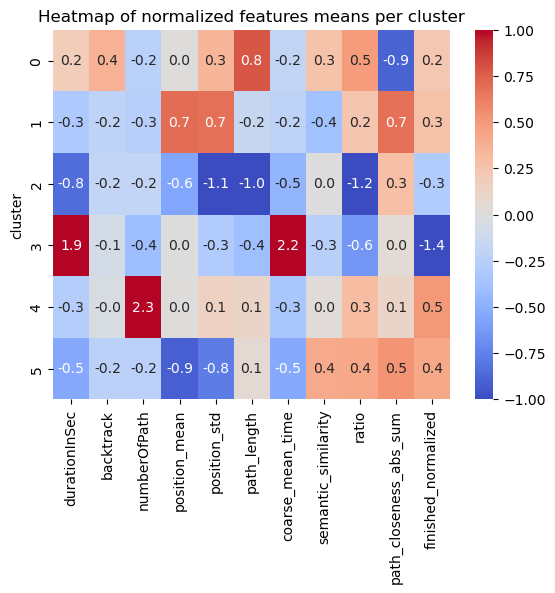

In [38]:
# heatmap of features means per cluster
means = plot_data.groupby(plot_data["cluster"]).mean()
sns.heatmap(means, cmap="coolwarm", annot=True, fmt=".1f", vmin=-1, vmax=1)
plt.title("Heatmap of normalized features means per cluster")
plt.show()

### Number of paths per cluster

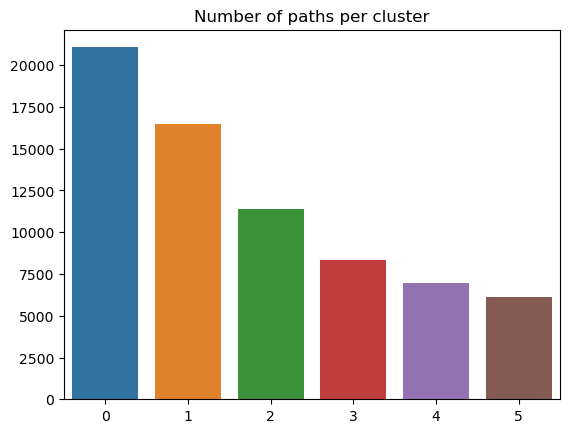

In [39]:
clusters_names,n_points = np.unique(plot_data["cluster"], return_counts=True)
sns.barplot(x=clusters_names, y=n_points).set_title("Number of paths per cluster")
plt.show()

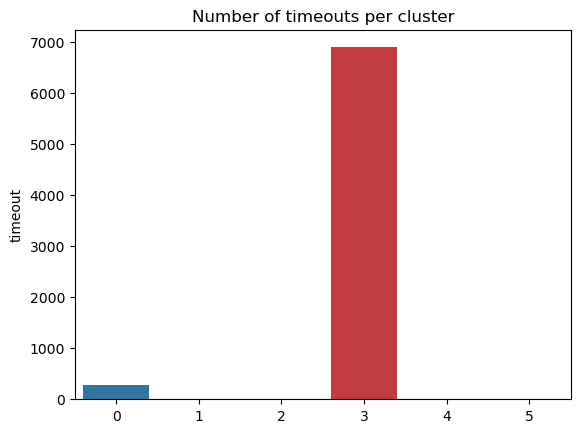

In [40]:
if not FILTER_TIMEOUT:
    # number of timeouts per cluster
    plot_data["timeout"] = combined_df["type"] == "timeout"
    timeout_per_cluster = plot_data.groupby(plot_data["cluster"])["timeout"].sum()
    sns.barplot(x=clusters_names, y=timeout_per_cluster).set_title(
        "Number of timeouts per cluster"
    )

We can see that the paths corresponding to the timeouts are almost all assigned to the same cluster.